In [1]:
from IPython.display import clear_output as clear
!pip install tensorflow-addons
clear()

In [2]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 11120444567415300048
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 10063183872
locality {
  bus_id: 1
  links {
  }
}
incarnation: 6214981136241938296
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3060, pci bus id: 0000:01:00.0, compute capability: 8.6"
xla_global_id: 416903419
]


In [3]:
import os
import keras
import numpy as np
from glob import glob
from tqdm import tqdm
import tensorflow as tf
from random import random

# Data
import tensorflow.image as tfi
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

from keras.layers import ReLU
from keras.layers import Input
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import concatenate
from keras.layers import ZeroPadding2D
from keras.layers import Conv2DTranspose
from tensorflow_addons.layers import InstanceNormalization

# Model Functions
from keras.models import Model
from keras.models import load_model
from keras.models import Sequential
from keras.initializers import RandomNormal

# Optimizers
from tensorflow.keras.optimizers import Adam

# Loss
from keras.losses import BinaryCrossentropy

# Model Viz
from tensorflow.keras.utils import plot_model

C:\Users\IT\anaconda3\envs\gpu\lib\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
C:\Users\IT\anaconda3\envs\gpu\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.11.0 and strictly below 2.14.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.10.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to 

In [4]:
def show_image(image, title=None):
    '''
    The function takes in an image and plots it using Matplotlib.
    '''
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')

In [5]:
root_horse_path = r'C:\Users\IT\midas\Hayao\trainA'
root_zebra_path = r'C:\Users\IT\midas\Hayao\trainB'
horse_paths = sorted(glob(root_horse_path + '/*.jpg'))[200:800]
zebra_paths = sorted(glob(root_zebra_path + '/*.png'))[:600]

In [6]:
print(f'Number of horse images: {len(horse_paths)}')
print(f'Number of zebra images: {len(zebra_paths)}')

Number of horse images: 600
Number of zebra images: 600


In [7]:
SIZE = 256
horse_images, zebra_images = np.zeros(shape=(len(horse_paths),SIZE,SIZE,3)), np.zeros(shape=(len(horse_paths),SIZE,SIZE,3))
for i,(horse_path, zebra_path) in tqdm(enumerate(zip(horse_paths, zebra_paths)), desc='Loading'):
    
    horse_image = img_to_array(load_img(horse_path))
    horse_image = tfi.resize(tf.cast(horse_image, tf.float32)/255., (SIZE, SIZE))
    
    zebra_image = img_to_array(load_img(zebra_path))
    zebra_image = tfi.resize(tf.cast(zebra_image,tf.float32)/255., (SIZE, SIZE))
    
    # as the data is unpaired so we don't have to worry about, positioning the images.
    
    horse_images[i] = horse_image
    zebra_images[i] = zebra_image

Loading: 600it [00:06, 95.53it/s] 


In [8]:
print(horse_images[599])

[[[0.89019608 0.8509804  0.65882355]
  [0.89411765 0.85490197 0.66274512]
  [0.89411765 0.84705883 0.65882355]
  ...
  [0.43529412 0.3764706  0.29411766]
  [0.51372552 0.4509804  0.3882353 ]
  [0.56862748 0.50588238 0.44313726]]

 [[0.89411765 0.8509804  0.67058825]
  [0.89411765 0.8509804  0.67058825]
  [0.89803922 0.84705883 0.67058825]
  ...
  [0.42352942 0.36470589 0.28235295]
  [0.45490196 0.39607844 0.32156864]
  [0.49019608 0.42745098 0.36470589]]

 [[0.89019608 0.84705883 0.67058825]
  [0.89411765 0.8509804  0.67450982]
  [0.89803922 0.85490197 0.67843139]
  ...
  [0.41568628 0.35686275 0.26666668]
  [0.36470589 0.30588236 0.23137255]
  [0.34509805 0.28627452 0.21176471]]

 ...

 [[0.86666667 0.81960785 0.62352943]
  [0.87058824 0.82352942 0.627451  ]
  [0.87450981 0.81960785 0.627451  ]
  ...
  [0.87843138 0.82745099 0.65098041]
  [0.87843138 0.82745099 0.65098041]
  [0.87843138 0.82745099 0.65098041]]

 [[0.86666667 0.81960785 0.62352943]
  [0.86666667 0.81960785 0.62352943]


In [9]:
dataset = [horse_images, zebra_images]

In [10]:
def ResidualBlock(filters, layer, index):
#     init = RandomNormal(stddev=0.02)
    
    x = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False, name="Block_{}_Conv1".format(index))(layer)
    x = InstanceNormalization(axis=-1, name="Block_{}_Normalization1".format(index))(x)
    x = ReLU(name="Block_{}_ReLU".format(index))(x)
    
    x = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False, name="Block_{}_Conv2".format(index))(x)
    x = InstanceNormalization(axis=-1, name="Block_{}_Normalization2".format(index))(x)
    
    x = concatenate([x, layer], name="Block_{}_Merge".format(index))
    
    return x

In [11]:
def downsample(filters, layer, size=3, strides=2, activation=None, index=None, norm=True):
    x = Conv2D(filters, kernel_size=size, strides=strides, padding='same', kernel_initializer='he_normal', use_bias=False, name="Encoder_{}_Conv".format(index))(layer)
    if norm:
        x = InstanceNormalization(axis=-1, name="Encoder_{}_Normalization".format(index))(x)
    if activation is not None:
        x = Activation(activation, name="Encoder_{}_Activation".format(index))(x)
    else:
        x = LeakyReLU( name="Encoder_{}_LeakyReLU".format(index))(x)
    return x

In [12]:
def upsample(filters, layer, size=3, strides=2, index=None):
    x = Conv2DTranspose(filters, kernel_size=size, strides=strides, padding='same', kernel_initializer='he_normal', use_bias=False, name="Decoder_{}_ConvT".format(index))(layer)
    x = InstanceNormalization(axis=-1, name="Decoder_{}_Normalization".format(index))(x)
    x = ReLU( name="Encoder_{}_ReLU".format(index))(x)
    return x

In [13]:
def Generator(n_resnet=9, name="Generator"):
    
    inp_image = Input(shape=(SIZE, SIZE, 3), name="InputImage")         # 256 x 256 x3
    
    x = downsample(64, inp_image, size=7, strides=1, index=1)           # 256 x 256 x 64
    x = downsample(128, x, index=2)                                     # 128 x 128 x 128
    x = downsample(256, x, index=3)                                     # 64 x 64 x 256
    
    for i in range(n_resnet):
        x = ResidualBlock(256, x, index=i+4)                             # (64 x 64 x 256) x n_resnet
    
    x = upsample(128, x, index=13)                                       # 128 x 128 x 128
    x = upsample(64, x, index=14)                                        # 256 x 256 x 64
    x = downsample(3, x, size=7, strides=1, activation='tanh', index=15) # 256 x 256 x 3
    
    model = Model(
        inputs=inp_image,
        outputs=x,
        name=name
    )
    return model

In [14]:
def Discriminator(name='Discriminator'):
    init = RandomNormal(stddev=0.02)
    src_img = Input(shape=(SIZE, SIZE, 3), name="InputImage")     # 256 x 256 x 3
    x = downsample(64, src_img, size=4, strides=2, index=1, norm=False) # 128 x 128 x 64
    x = downsample(128, x, size=4, strides=2, index=2)            # 64 x 64 x 128
    x = downsample(256, x, size=4, strides=2, index=3)            # 32 x 32 x 256
    x = downsample(512, x, size=4, strides=2, index=4)            # 16 x 16 x 512
    x = downsample(512, x, size=4, strides=2, index=5)            # 8 x 8 x 512  # we can try out a different architecture with zero padding layer.
    patch_out = Conv2D(1, kernel_size=4, padding='same', kernel_initializer=init, use_bias=False)(x) # 8 x 8 x 1
    
    model = Model(
        inputs=src_img,
        outputs=patch_out,
        name=name
    )
    model.compile(
        loss='mse',
        optimizer=Adam(learning_rate=2e-4, beta_1=0.5),
        loss_weights=[0.5]
    )
    return model

In [15]:
def CombineModel(g_model1, g_model2, d_model, name):
    # train the Generator
    g_model1.trainable = True

    # Stop the Discriminator and 2nd Generator
    d_model.trainable = False
    g_model2.trainable = False
    
    # Adversarial Loss
    input_gen = Input(shape=(SIZE, SIZE, 3))
    gen_1_out = g_model1(input_gen)
    dis_out = d_model(gen_1_out)
    
    # Identity Loss
    input_id = Input(shape=(SIZE, SIZE, 3))
    output_id = g_model1(input_id)
    
    # Cycle Loss - Forward
    output_f = g_model2(gen_1_out)
    
    # Cycle Loss - Backward
    gen_2_out = g_model2(input_id)
    output_b = g_model1(gen_2_out)
    
    # Final Model 
    model = Model(
        inputs=[input_gen, input_id],
        outputs=[dis_out, output_id, output_f, output_b],
        name=name
    )
    model.compile(
        loss=['mse', 'mae', 'mae', 'mae'],
        loss_weights=[1,5,10,10],
        optimizer= Adam(learning_rate=2e-4, beta_1=0.5)
    )
    return model

In [16]:
def generate_real_samples(n_samples, dataset):
    ix = np.random.randint(0,dataset.shape[0], n_samples)
    X = dataset[ix]
    y = np.ones(shape=(n_samples, 8, 8, 1))
    return X, y

In [17]:
def generate_fake_samples(g_model, dataset):
    X = g_model.predict(dataset)
    y = np.zeros(shape=(len(dataset), 8, 8, 1))
    return X, y

In [18]:
def update_image_pool(pool, images, max_size=50):
    selected = list()
    for image in images:
        if len(pool) < max_size:
            pool.append(image)
            selected.append(image)
        elif random() < 0.5:
            selected.append(image)
        else:
            ix = np.random.randint(0,len(pool))
            selected.append(pool[ix])
            pool[ix] = image
    return np.asarray(selected)

In [19]:
def show_preds(g_AB, g_BA,n_images=1):
    for i in range(n_images):
        
        id = np.random.randint(len(horse_images))
        horse, zebra = horse_images[id], zebra_images[id]
        horse_pred, zebra_pred = g_BA.predict(tf.expand_dims(zebra,axis=0))[0], g_AB.predict(tf.expand_dims(horse,axis=0))[0]
        
        plt.figure(figsize=(10,8))
        
        plt.subplot(1,4,1)
        show_image(horse, title='Original Hayao')
        
        plt.subplot(1,4,2)
        show_image(zebra_pred, title='Generated Photo')
        
        plt.subplot(1,4,3)
        show_image(zebra, title='Original Photo')
        
        plt.subplot(1,4,4)
        show_image(horse_pred, title='Genrated Hayao')
        
        plt.tight_layout()
        plt.show()

In [20]:
from tqdm import tqdm

def train(d_model_A, d_model_B, gen_AB, gen_BA, c_AB, c_BA, epochs=10, chunk=5):
    
    n_epochs, n_batch = epochs, 1
    
    trainA, trainB = dataset
    poolA, poolB = list(), list()
    
    # in simple words, we are going through the whole data.
    bat_per_epoch = int(len(trainA)/n_batch)
    n_steps = bat_per_epoch
    
    for j in tqdm(range(1, epochs + 1), desc="Epochs"):
        # Initialize accumulators for losses
        total_dA_loss_real = 0
        total_dA_loss_fake = 0
        total_dB_loss_real = 0
        total_dB_loss_fake = 0
        total_gen_loss1 = 0
        total_gen_loss2 = 0
        
        for i in range(n_steps):
            
            # Let's get some real data in hand.
            X_realA, y_realA = generate_real_samples(n_batch, trainA)
            X_realB, y_realB = generate_real_samples(n_batch, trainB)

            # use our generators to generate some fake data.
            X_fakeA, y_fakeA = generate_fake_samples(gen_BA, X_realB)
            X_fakeB, y_fakeB = generate_fake_samples(gen_AB, X_realA)
            
            # create a pool of images. You can also understand it like a replay buffer.
            X_fakeA = update_image_pool(poolA, X_fakeA)
            X_fakeB = update_image_pool(poolB, X_fakeB)
            
            # Let's finally train the gen 2 and get the losses.
            gen_loss2, _, _, _, _ = c_BA.train_on_batch(
                [X_realB, X_realA],
                [y_realB, X_realA, X_realB, X_realA]
            )
            
            # It's time for our discriminator to win our generator.
            dA_loss_real = d_model_A.train_on_batch(X_realA, y_realA)
            dA_loss_fake = d_model_A.train_on_batch(X_fakeA, y_fakeA)
            
            # one cycle is completed, let's move to second cycle.
            gen_loss1, _, _, _, _ = c_AB.train_on_batch(
                [X_realA, X_realB],
                [y_realA, X_realB, X_realA, X_realB]
            )
            
            # again, let's give some power to our discriminators.
            dB_loss_real = d_model_B.train_on_batch(X_realB, y_realB)
            dB_loss_fake = d_model_B.train_on_batch(X_fakeB, y_fakeB)
            
            # Accumulate losses
            total_dA_loss_real += dA_loss_real
            total_dA_loss_fake += dA_loss_fake
            total_dB_loss_real += dB_loss_real
            total_dB_loss_fake += dB_loss_fake
            total_gen_loss1 += gen_loss1
            total_gen_loss2 += gen_loss2

        # Calculate average losses for the epoch
        avg_dA_loss_real = total_dA_loss_real / n_steps
        avg_dA_loss_fake = total_dA_loss_fake / n_steps
        avg_dB_loss_real = total_dB_loss_real / n_steps
        avg_dB_loss_fake = total_dB_loss_fake / n_steps
        avg_gen_loss1 = total_gen_loss1 / n_steps
        avg_gen_loss2 = total_gen_loss2 / n_steps
        
        # Print average losses for the epoch
        print(f'Epoch {j}/{epochs}')
        print(f'dA_loss_real: {avg_dA_loss_real}, dA_loss_fake: {avg_dA_loss_fake}')
        print(f'dB_loss_real: {avg_dB_loss_real}, dB_loss_fake: {avg_dB_loss_fake}')
        print(f'gen_loss1: {avg_gen_loss1}, gen_loss2: {avg_gen_loss2}')

        if (j % chunk) == 0:
            show_preds(gen_AB, gen_BA, n_images=1)
        
        if j in [70,80,90]:
            gen_AB.save(f"GeneratorHtoP_{j}.h5")
            gen_BA.save(f"GeneratorPtoH_{j}.h5")


In [22]:
def train(d_model_A, d_model_B, gen_AB, gen_BA, c_AB, c_BA, epochs=10, chunk=5):
    
    n_epochs, n_batch = epochs, 1
    
    trainA, trainB = dataset
    poolA, poolB = list(), list()
    
    # in simple words, we are going through the whole data.
    bat_per_epoch = int(len(trainA)/n_batch)
    n_steps = bat_per_epoch
    
    for j in tqdm(range(1,epochs+1), desc="Epochs"):
        for i in range(n_steps):
            
            # Let's get some real data in hand.
            X_realA, y_realA = generate_real_samples(n_batch, trainA)
            X_realB, y_realB = generate_real_samples(n_batch, trainB)

            # use our generators to generate some fake data.
            X_fakeA, y_fakeA = generate_fake_samples(gen_BA, X_realB)
            X_fakeB, y_fakeB = generate_fake_samples(gen_AB, X_realA)
            
            # create a pool of images. You can also understand it like a replay buffer.
            X_fakeA = update_image_pool(poolA, X_fakeA)
            X_fakeB = update_image_pool(poolA, X_fakeB)
            
            
            # Let's finally train the gen 2 and get the losses.
            gen_loss2, _, _, _, _ = c_BA.train_on_batch(
                [X_realB, X_realA],
                [y_realB, X_realA, X_realB, X_realA]
            )
            
            # It's time for our discriminator to win our generator.
            dA_loss_1 = d_model_A.train_on_batch(X_realA, y_realA)
            dA_loss_2 = d_model_A.train_on_batch(X_fakeA, y_fakeA)
            
            # one cycle is completed, let's move to second cycle.
            gen_loss1, _, _, _, _ = c_AB.train_on_batch(
                [X_realA, X_realB],
                [y_realA, X_realB, X_realA, X_realB]
            )
            
            # again, let's give some power to our discriminators.
            dB_loss_1 = d_model_B.train_on_batch(X_realB, y_realB)
            dB_loss_2 = d_model_B.train_on_batch(X_fakeB, y_fakeB)

        if (j % chunk) == 0:
            show_preds(gen_AB, gen_BA, n_images=1)
        
        if j in [20,25,30,35]:
            gen_AB.save(f"GeneratorHtoP_{j}.h5")
            gen_BA.save(f"GeneratorPtoH_{j}.h5")

In [27]:
g_AB = Generator(name="GeneratorAB")
g_BA = Generator(name="GeneratorBA")

# here are the respective discriminators.
d_A = Discriminator(name="DiscriminatorA")
d_B = Discriminator(name="DiscriminatorB")

# finally, let's combine all of them.
c_AB = CombineModel(g_AB, g_BA, d_B, name="GanAB")
c_BA = CombineModel(g_BA, g_AB, d_A, name="GanBA")

Epochs:   0%|                                                                                  | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epochs:   1%|▋                                                                    | 1/100 [19:56<32:54:07, 1196.44s/it]

Epoch 1/100
dA_loss_real: 0.1401317395704488, dA_loss_fake: 0.11655898750837271
dB_loss_real: 0.15597622931779673, dB_loss_fake: 0.1602733076356041
gen_loss1: 7.943223950862884, gen_loss2: 7.885565540393194
1/1 [==============================] - 0s 20ms/step


Epochs:   2%|█▍                                                                   | 2/100 [39:07<31:50:50, 1169.90s/it]

Epoch 2/100
dA_loss_real: 0.02068303689593449, dA_loss_fake: 0.02058784296309265
dB_loss_real: 0.01728544170114522, dB_loss_fake: 0.017746838076078953
gen_loss1: 5.923855721553167, gen_loss2: 5.9728188757101695
1/1 [==============================] - 0s 21ms/step


Epochs:   3%|██                                                                   | 3/100 [58:21<31:19:03, 1162.30s/it]

Epoch 3/100
dA_loss_real: 0.02171721726966401, dA_loss_fake: 0.019243876431137324
dB_loss_real: 0.025499041847263773, dB_loss_fake: 0.028058815952778482
gen_loss1: 4.97568178931872, gen_loss2: 5.06921050230662
1/1 [==============================] - 0s 20ms/step


Epochs:   4%|██▋                                                                | 4/100 [1:17:36<30:55:15, 1159.54s/it]

Epoch 4/100
dA_loss_real: 0.021206077362100284, dA_loss_fake: 0.0193904349625033
dB_loss_real: 0.024999555923277513, dB_loss_fake: 0.023812691594551627
gen_loss1: 4.33728077451388, gen_loss2: 4.478342677752177
1/1 [==============================] - 0s 20ms/step
Epoch 5/100
dA_loss_real: 0.020387638971830407, dA_loss_fake: 0.016869883088899466
dB_loss_real: 0.01907264759861088, dB_loss_fake: 0.012287931661315572
gen_loss1: 3.8715635724862416, gen_loss2: 4.052176161209743
1/1 [==============================] - 1s 655ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


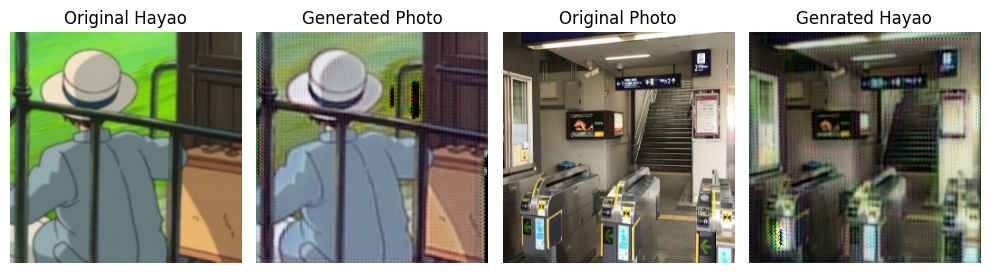

Epochs:   5%|███▎                                                               | 5/100 [1:36:56<30:36:18, 1159.78s/it]

1/1 [==============================] - 0s 20ms/step


Epochs:   6%|████                                                               | 6/100 [1:56:17<30:17:46, 1160.28s/it]

Epoch 6/100
dA_loss_real: 0.01542990195225381, dA_loss_fake: 0.013699897438588475
dB_loss_real: 0.034313644846940106, dB_loss_fake: 0.027446265186784634
gen_loss1: 3.822843901316325, gen_loss2: 4.021472464402517
1/1 [==============================] - 0s 21ms/step


Epochs:   7%|████▋                                                              | 7/100 [2:15:41<30:00:18, 1161.49s/it]

Epoch 7/100
dA_loss_real: 0.01659080619147668, dA_loss_fake: 0.01352065767646612
dB_loss_real: 0.02559637567513467, dB_loss_fake: 0.018728860050808482
gen_loss1: 3.5632902175188064, gen_loss2: 3.7769045301278434
1/1 [==============================] - 0s 20ms/step


Epochs:   8%|█████▎                                                             | 8/100 [2:35:08<29:43:18, 1163.02s/it]

Epoch 8/100
dA_loss_real: 0.018301026419115563, dA_loss_fake: 0.016668936167649615
dB_loss_real: 0.012537168107713418, dB_loss_fake: 0.004277218908440166
gen_loss1: 3.4196017837524413, gen_loss2: 3.599115351438522
1/1 [==============================] - 0s 27ms/step


Epochs:   9%|██████                                                             | 9/100 [2:54:38<29:27:11, 1165.18s/it]

Epoch 9/100
dA_loss_real: 0.0109089078711501, dA_loss_fake: 0.009796102432301269
dB_loss_real: 0.02463065232033841, dB_loss_fake: 0.023395246705501145
gen_loss1: 3.304956511060397, gen_loss2: 3.5023955448468524
1/1 [==============================] - 0s 23ms/step
Epoch 10/100
dA_loss_real: 0.011147026212711353, dA_loss_fake: 0.010273946633581848
dB_loss_real: 0.11568839880191566, dB_loss_fake: 0.11249967704410664
gen_loss1: 2.9622482653458913, gen_loss2: 3.6791009171803792
1/1 [==============================] - 0s 21ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


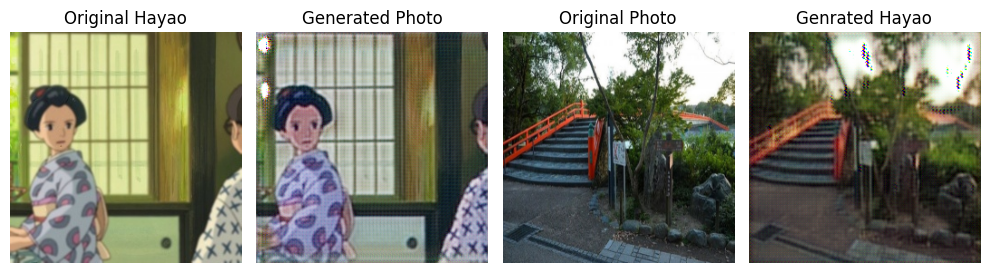

Epochs:  10%|██████▌                                                           | 10/100 [3:14:12<29:11:57, 1167.97s/it]

1/1 [==============================] - 0s 22ms/step


Epochs:  11%|███████▎                                                          | 11/100 [3:33:49<28:56:33, 1170.71s/it]

Epoch 11/100
dA_loss_real: 0.007817373752186541, dA_loss_fake: 0.008433717505346673
dB_loss_real: 0.13221719350200145, dB_loss_fake: 0.12469404934284588
gen_loss1: 2.664011733531952, gen_loss2: 3.491409161090851
1/1 [==============================] - 0s 23ms/step


Epochs:  12%|███████▉                                                          | 12/100 [3:53:30<28:41:52, 1174.01s/it]

Epoch 12/100
dA_loss_real: 0.010387328780489043, dA_loss_fake: 0.009716553502269866
dB_loss_real: 0.12233699474250898, dB_loss_fake: 0.1172420885747609
gen_loss1: 2.6221048470338184, gen_loss2: 3.4163598012924195
1/1 [==============================] - 0s 20ms/step


Epochs:  13%|████████▌                                                         | 13/100 [4:13:19<28:28:51, 1178.53s/it]

Epoch 13/100
dA_loss_real: 0.01844990850057608, dA_loss_fake: 0.01312887169837874
dB_loss_real: 0.116165791816699, dB_loss_fake: 0.11428178623473893
gen_loss1: 2.628168548544248, gen_loss2: 3.4402872943878173
1/1 [==============================] - 0s 26ms/step


Epochs:  14%|█████████▏                                                        | 14/100 [4:33:13<28:15:51, 1183.15s/it]

Epoch 14/100
dA_loss_real: 0.10643631900311448, dA_loss_fake: 0.10695901694552352
dB_loss_real: 0.10859777414317554, dB_loss_fake: 0.10623429119431724
gen_loss1: 2.8248531252145765, gen_loss2: 3.162652265628179
1/1 [==============================] - 0s 24ms/step
Epoch 15/100
dA_loss_real: 0.1096781337625968, dA_loss_fake: 0.1037136023507143
dB_loss_real: 0.10158641296516482, dB_loss_fake: 0.10054793580668048
gen_loss1: 2.7844095718860626, gen_loss2: 3.042280221184095
1/1 [==============================] - 0s 39ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


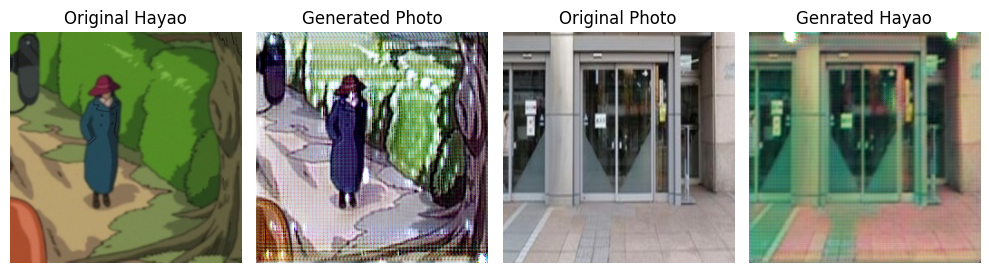

Epochs:  15%|█████████▉                                                        | 15/100 [4:53:14<28:03:40, 1188.48s/it]

1/1 [==============================] - 0s 26ms/step


Epochs:  16%|██████████▌                                                       | 16/100 [5:13:20<27:51:09, 1193.68s/it]

Epoch 16/100
dA_loss_real: 0.10215265232293556, dA_loss_fake: 0.090220218989222
dB_loss_real: 0.09744631465213995, dB_loss_fake: 0.09776757528074086
gen_loss1: 2.802929902076721, gen_loss2: 3.064566453496615
1/1 [==============================] - 0s 23ms/step


Epochs:  17%|███████████▏                                                      | 17/100 [5:33:30<27:38:03, 1198.59s/it]

Epoch 17/100
dA_loss_real: 0.08986993835540488, dA_loss_fake: 0.08156845967207725
dB_loss_real: 0.09340122829191387, dB_loss_fake: 0.1014272044513685
gen_loss1: 2.6086666723092398, gen_loss2: 2.9046076873938245
1/1 [==============================] - 0s 22ms/step


Epochs:  18%|███████████▉                                                      | 18/100 [5:53:49<27:26:45, 1204.94s/it]

Epoch 18/100
dA_loss_real: 0.07127301835920662, dA_loss_fake: 0.06587733954268818
dB_loss_real: 0.09604728154682865, dB_loss_fake: 0.1008169930963777
gen_loss1: 2.5523795948425927, gen_loss2: 2.916350626349449
1/1 [==============================] - 0s 26ms/step


Epochs:  19%|████████████▌                                                     | 19/100 [6:14:12<27:13:44, 1210.17s/it]

Epoch 19/100
dA_loss_real: 0.07597947670534874, dA_loss_fake: 0.0672748369188048
dB_loss_real: 0.09346409547375516, dB_loss_fake: 0.10003771972144022
gen_loss1: 2.5710243382056555, gen_loss2: 2.933869950970014
1/1 [==============================] - 0s 26ms/step
Epoch 20/100
dA_loss_real: 0.06645490433322265, dA_loss_fake: 0.06328705223975703
dB_loss_real: 0.09028714411581557, dB_loss_fake: 0.09384036117078115
gen_loss1: 2.5255606245994566, gen_loss2: 2.9275652221838633
1/1 [==============================] - 0s 37ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


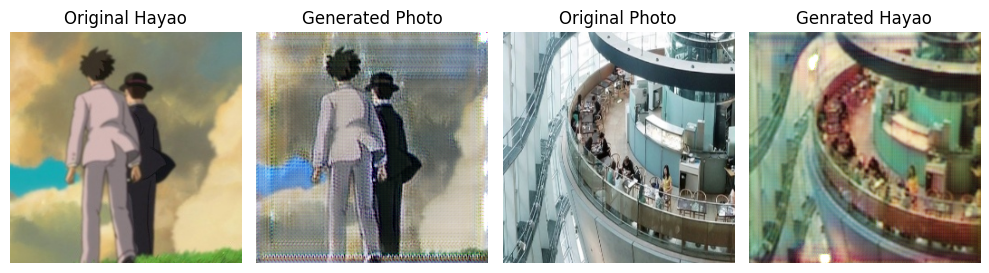

Epochs:  20%|█████████████▏                                                    | 20/100 [6:34:41<27:01:17, 1215.97s/it]

1/1 [==============================] - 0s 24ms/step


Epochs:  21%|█████████████▊                                                    | 21/100 [6:55:21<26:50:27, 1223.14s/it]

Epoch 21/100
dA_loss_real: 0.06366160094582786, dA_loss_fake: 0.060606884191123145
dB_loss_real: 0.08854501644227032, dB_loss_fake: 0.0974913257259565
gen_loss1: 2.570501987139384, gen_loss2: 2.9885580929120383
1/1 [==============================] - 0s 28ms/step


Epochs:  22%|██████████████▌                                                   | 22/100 [7:16:03<26:37:33, 1228.89s/it]

Epoch 22/100
dA_loss_real: 0.05526884997496381, dA_loss_fake: 0.05166963552706875
dB_loss_real: 0.08506713400129229, dB_loss_fake: 0.09067588981240987
gen_loss1: 2.6500122209390002, gen_loss2: 3.1067011946439744
1/1 [==============================] - 0s 31ms/step


Epochs:  23%|███████████████▏                                                  | 23/100 [7:36:54<26:25:37, 1235.55s/it]

Epoch 23/100
dA_loss_real: 0.062404978189151736, dA_loss_fake: 0.05825139330467209
dB_loss_real: 0.0858863966873226, dB_loss_fake: 0.0893089379556477
gen_loss1: 2.5635538218418756, gen_loss2: 2.9863429246346156
1/1 [==============================] - 0s 28ms/step


Epochs:  24%|███████████████▊                                                  | 24/100 [7:57:57<26:15:12, 1243.59s/it]

Epoch 24/100
dA_loss_real: 0.05137897314038128, dA_loss_fake: 0.046896662576279294
dB_loss_real: 0.06847345277511825, dB_loss_fake: 0.0746253402166379
gen_loss1: 2.6538843162854513, gen_loss2: 3.0112092916170754
1/1 [==============================] - 0s 25ms/step
Epoch 25/100
dA_loss_real: 0.04974020716113349, dA_loss_fake: 0.046735089098025734
dB_loss_real: 0.06981041836785153, dB_loss_fake: 0.07798916813218966
gen_loss1: 2.590511214931806, gen_loss2: 3.040458357334137
1/1 [==============================] - 0s 25ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


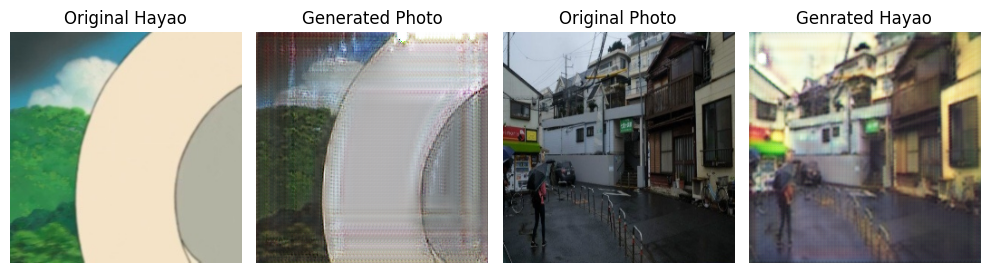

Epochs:  25%|████████████████▌                                                 | 25/100 [8:19:02<26:02:41, 1250.15s/it]

1/1 [==============================] - 0s 37ms/step


Epochs:  26%|█████████████████▏                                                | 26/100 [8:40:17<25:50:49, 1257.42s/it]

Epoch 26/100
dA_loss_real: 0.04847062076053892, dA_loss_fake: 0.04585307850269601
dB_loss_real: 0.06302481714713698, dB_loss_fake: 0.06972309982636943
gen_loss1: 2.645724666515986, gen_loss2: 3.0494708730777105
1/1 [==============================] - 0s 34ms/step


Epochs:  27%|█████████████████▊                                                | 27/100 [9:01:43<25:40:22, 1266.06s/it]

Epoch 27/100
dA_loss_real: 0.043523145315703005, dA_loss_fake: 0.040298054423959305
dB_loss_real: 0.06429244470782577, dB_loss_fake: 0.0695135156538648
gen_loss1: 2.625820686618487, gen_loss2: 3.0527782408396402
1/1 [==============================] - 0s 30ms/step


Epochs:  28%|██████████████████▍                                               | 28/100 [9:23:10<25:27:02, 1272.53s/it]

Epoch 28/100
dA_loss_real: 0.041301692347818365, dA_loss_fake: 0.03943896639083202
dB_loss_real: 0.0584601937700063, dB_loss_fake: 0.05814715513105815
gen_loss1: 2.7288280069828033, gen_loss2: 3.086067615946134
1/1 [==============================] - 0s 27ms/step


Epochs:  29%|███████████████████▏                                              | 29/100 [9:44:51<25:15:40, 1280.85s/it]

Epoch 29/100
dA_loss_real: 0.03892308577933969, dA_loss_fake: 0.03589122128440067
dB_loss_real: 0.05436534467580107, dB_loss_fake: 0.05943807129592945
gen_loss1: 2.7243429789940516, gen_loss2: 3.0967816700538
1/1 [==============================] - 0s 33ms/step
Epoch 30/100
dA_loss_real: 0.03747167518401208, dA_loss_fake: 0.03724822725402191
dB_loss_real: 0.05012373761894802, dB_loss_fake: 0.057718112282454964
gen_loss1: 2.6901998108625413, gen_loss2: 3.072858634988467
1/1 [==============================] - 0s 41ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


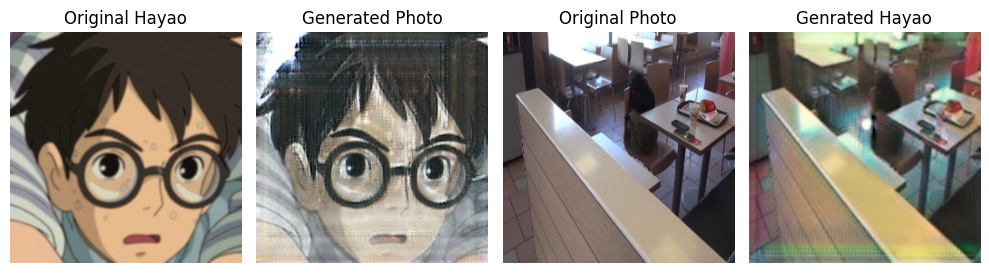

Epochs:  30%|███████████████████▌                                             | 30/100 [10:06:32<25:01:32, 1287.03s/it]

1/1 [==============================] - 0s 28ms/step


Epochs:  31%|████████████████████▏                                            | 31/100 [10:28:31<24:51:02, 1296.56s/it]

Epoch 31/100
dA_loss_real: 0.03344136631504322, dA_loss_fake: 0.031796508727905654
dB_loss_real: 0.05422485122301926, dB_loss_fake: 0.05904283589916304
gen_loss1: 2.750324487090111, gen_loss2: 3.138612293601036
1/1 [==============================] - 0s 35ms/step


Epochs:  32%|████████████████████▊                                            | 32/100 [10:50:33<24:37:58, 1304.09s/it]

Epoch 32/100
dA_loss_real: 0.03082816905807704, dA_loss_fake: 0.03043731065816246
dB_loss_real: 0.046570815718732776, dB_loss_fake: 0.0487699483265169
gen_loss1: 2.8300880416234335, gen_loss2: 3.204613050222397
1/1 [==============================] - 0s 33ms/step


Epochs:  33%|█████████████████████▍                                           | 33/100 [11:12:37<24:22:56, 1310.10s/it]

Epoch 33/100
dA_loss_real: 0.032303726367341974, dA_loss_fake: 0.031212622518651187
dB_loss_real: 0.042099579451217624, dB_loss_fake: 0.045517109716311094
gen_loss1: 2.8214727010329566, gen_loss2: 3.1066417115926743
1/1 [==============================] - 0s 37ms/step


Epochs:  34%|██████████████████████                                           | 34/100 [11:35:18<24:17:54, 1325.38s/it]

Epoch 34/100
dA_loss_real: 0.03190492641219559, dA_loss_fake: 0.02828067437551605
dB_loss_real: 0.045081053640072546, dB_loss_fake: 0.04932865726140638
gen_loss1: 2.715407034754753, gen_loss2: 3.085966458320618
1/1 [==============================] - 0s 36ms/step
Epoch 35/100
dA_loss_real: 0.032785033479255314, dA_loss_fake: 0.029216893448028712
dB_loss_real: 0.04095911051922788, dB_loss_fake: 0.043087383614232144
gen_loss1: 2.750705165863037, gen_loss2: 3.0401873125632606
1/1 [==============================] - 0s 33ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


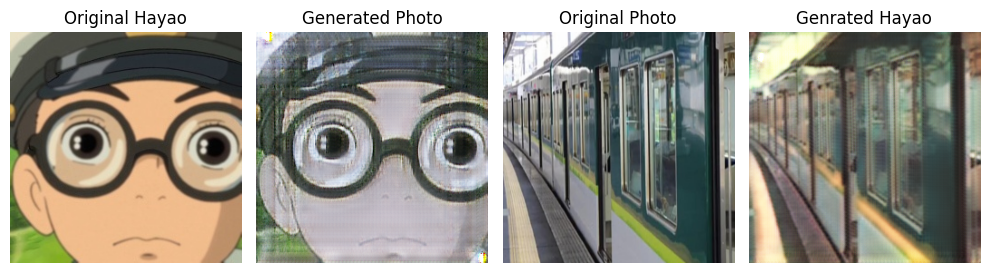

Epochs:  35%|██████████████████████▊                                          | 35/100 [11:58:47<24:23:00, 1350.47s/it]

1/1 [==============================] - 0s 57ms/step


Epochs:  36%|███████████████████████▍                                         | 36/100 [12:21:59<24:14:01, 1363.14s/it]

Epoch 36/100
dA_loss_real: 0.028691002821627384, dA_loss_fake: 0.02836555369004297
dB_loss_real: 0.03805165659325818, dB_loss_fake: 0.04142890582093969
gen_loss1: 2.775233304699262, gen_loss2: 3.1013187257448833
1/1 [==============================] - 0s 34ms/step


Epochs:  37%|████████████████████████                                         | 37/100 [12:47:07<24:36:50, 1406.52s/it]

Epoch 37/100
dA_loss_real: 0.026969423906023925, dA_loss_fake: 0.024418530886759982
dB_loss_real: 0.04384920333201687, dB_loss_fake: 0.04643145244413366
gen_loss1: 2.671054248015086, gen_loss2: 3.0025109217564263
1/1 [==============================] - 0s 31ms/step


Epochs:  38%|████████████████████████▋                                        | 38/100 [13:09:53<24:00:49, 1394.35s/it]

Epoch 38/100
dA_loss_real: 0.02848711873133046, dA_loss_fake: 0.02740145112387836
dB_loss_real: 0.04060525188416553, dB_loss_fake: 0.046314658477591975
gen_loss1: 2.6348171782493592, gen_loss2: 3.009950824379921
1/1 [==============================] - 0s 38ms/step


Epochs:  39%|█████████████████████████▎                                       | 39/100 [13:32:41<23:29:28, 1386.37s/it]

Epoch 39/100
dA_loss_real: 0.02360956276592333, dA_loss_fake: 0.023776161540687703
dB_loss_real: 0.040006050082544486, dB_loss_fake: 0.044422919447533786
gen_loss1: 2.6644638597965242, gen_loss2: 3.0475665585199994
1/1 [==============================] - 0s 44ms/step
Epoch 40/100
dA_loss_real: 0.02516193441464566, dA_loss_fake: 0.02406203716256035
dB_loss_real: 0.042825190768344325, dB_loss_fake: 0.04728824840392917
gen_loss1: 2.6174408102035525, gen_loss2: 3.012415685256322
1/1 [==============================] - 0s 64ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


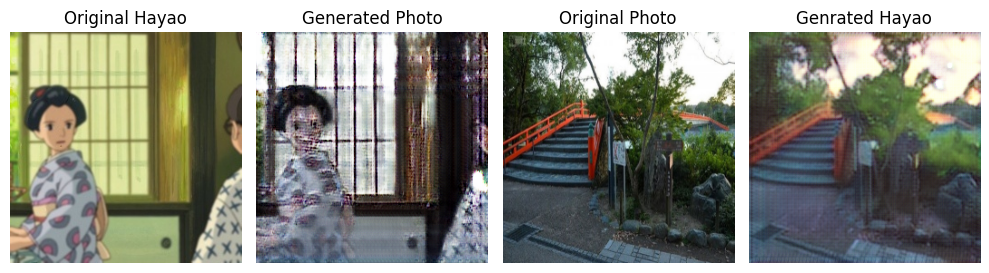

Epochs:  40%|██████████████████████████                                       | 40/100 [13:55:47<23:06:15, 1386.25s/it]

1/1 [==============================] - 0s 38ms/step


Epochs:  41%|██████████████████████████▋                                      | 41/100 [14:18:53<22:43:06, 1386.20s/it]

Epoch 41/100
dA_loss_real: 0.023085633785425063, dA_loss_fake: 0.02259621343963469
dB_loss_real: 0.03839632910133029, dB_loss_fake: 0.04507029354184245
gen_loss1: 2.680744445522626, gen_loss2: 3.086979755163193
1/1 [==============================] - 0s 38ms/step


Epochs:  42%|███████████████████████████▎                                     | 42/100 [14:42:07<22:22:13, 1388.50s/it]

Epoch 42/100
dA_loss_real: 0.020636656824111317, dA_loss_fake: 0.021178455560002477
dB_loss_real: 0.03252335247273246, dB_loss_fake: 0.03673790638179829
gen_loss1: 2.7524253777662913, gen_loss2: 3.1074526087443033
1/1 [==============================] - 0s 44ms/step


Epochs:  43%|███████████████████████████▉                                     | 43/100 [15:05:38<22:05:32, 1395.30s/it]

Epoch 43/100
dA_loss_real: 0.022602413373145586, dA_loss_fake: 0.022361782939406112
dB_loss_real: 0.03256148898314374, dB_loss_fake: 0.036364727661324044
gen_loss1: 2.780740779439608, gen_loss2: 3.11918670296669
1/1 [==============================] - 0s 52ms/step


Epochs:  44%|████████████████████████████▌                                    | 44/100 [15:29:07<21:45:59, 1399.28s/it]

Epoch 44/100
dA_loss_real: 0.015917905263292294, dA_loss_fake: 0.016097202540064852
dB_loss_real: 0.036954840703401715, dB_loss_fake: 0.040005093462144335
gen_loss1: 2.6620270693302155, gen_loss2: 3.123076766530673
1/1 [==============================] - 0s 35ms/step
Epoch 45/100
dA_loss_real: 0.019751759826322088, dA_loss_fake: 0.019939426163133853
dB_loss_real: 0.03479151734694218, dB_loss_fake: 0.03797197298457225
gen_loss1: 2.701768111983935, gen_loss2: 3.10535275220871
1/1 [==============================] - 0s 46ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


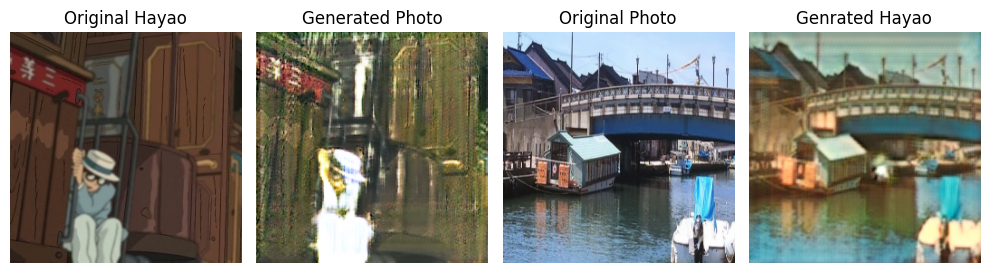

Epochs:  45%|█████████████████████████████▎                                   | 45/100 [15:52:54<21:30:22, 1407.68s/it]

1/1 [==============================] - 0s 63ms/step


Epochs:  46%|█████████████████████████████▉                                   | 46/100 [16:16:54<21:15:41, 1417.44s/it]

Epoch 46/100
dA_loss_real: 0.01974983721564058, dA_loss_fake: 0.017853023799252698
dB_loss_real: 0.028400416097526127, dB_loss_fake: 0.031141284174130607
gen_loss1: 2.7318020244439443, gen_loss2: 3.0450497380892436
1/1 [==============================] - 0s 37ms/step


Epochs:  47%|██████████████████████████████▌                                  | 47/100 [16:40:45<20:55:43, 1421.58s/it]

Epoch 47/100
dA_loss_real: 0.01727803253568709, dA_loss_fake: 0.018558196731028147
dB_loss_real: 0.030573103685552876, dB_loss_fake: 0.03412843066810941
gen_loss1: 2.772655869523684, gen_loss2: 3.0695741045475007
1/1 [==============================] - 0s 39ms/step


Epochs:  48%|███████████████████████████████▏                                 | 48/100 [17:04:52<20:38:36, 1429.16s/it]

Epoch 48/100
dA_loss_real: 0.018207186223783842, dA_loss_fake: 0.018472917813730116
dB_loss_real: 0.027220209304553766, dB_loss_fake: 0.030264530307613315
gen_loss1: 2.6835957795381544, gen_loss2: 3.017823723355929
1/1 [==============================] - 0s 50ms/step


Epochs:  49%|███████████████████████████████▊                                 | 49/100 [17:28:59<20:19:17, 1434.47s/it]

Epoch 49/100
dA_loss_real: 0.016743812578109404, dA_loss_fake: 0.0168202358779187
dB_loss_real: 0.027099159449571742, dB_loss_fake: 0.029887095960245157
gen_loss1: 2.652122276027997, gen_loss2: 2.977823770046234
1/1 [==============================] - 0s 40ms/step
Epoch 50/100
dA_loss_real: 0.017864766469962583, dA_loss_fake: 0.01790728135209065
dB_loss_real: 0.028430329458399985, dB_loss_fake: 0.03173975607574297
gen_loss1: 2.6362683844566344, gen_loss2: 2.97545547803243
1/1 [==============================] - 0s 82ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


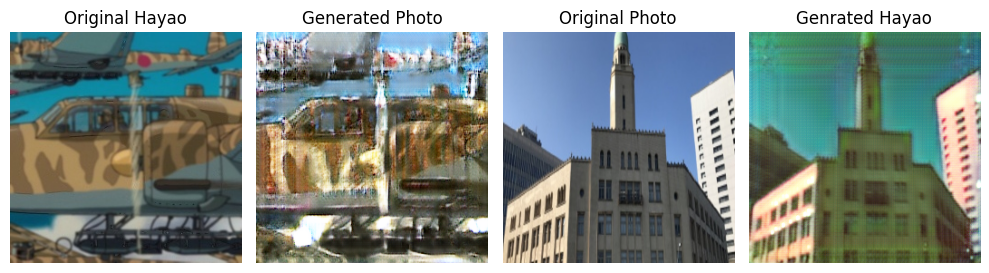

Epochs:  50%|████████████████████████████████▌                                | 50/100 [17:53:16<20:01:01, 1441.23s/it]

1/1 [==============================] - 0s 56ms/step


Epochs:  51%|█████████████████████████████████▏                               | 51/100 [18:18:19<19:52:03, 1459.66s/it]

Epoch 51/100
dA_loss_real: 0.016491658535669557, dA_loss_fake: 0.016092266068250562
dB_loss_real: 0.028599581736683224, dB_loss_fake: 0.031674941716870915
gen_loss1: 2.6580632666746777, gen_loss2: 3.033167433142662
1/1 [==============================] - 0s 51ms/step


Epochs:  52%|█████████████████████████████████▊                               | 52/100 [18:43:10<19:35:20, 1469.18s/it]

Epoch 52/100
dA_loss_real: 0.015100330698575514, dA_loss_fake: 0.014930499239902322
dB_loss_real: 0.02608845195771816, dB_loss_fake: 0.02967924917427202
gen_loss1: 2.69706917266051, gen_loss2: 3.017411607106527
1/1 [==============================] - 0s 61ms/step


Epochs:  53%|██████████████████████████████████▍                              | 53/100 [19:07:58<19:15:16, 1474.83s/it]

Epoch 53/100
dA_loss_real: 0.01705954153245936, dA_loss_fake: 0.01691828501158549
dB_loss_real: 0.028418230639072135, dB_loss_fake: 0.03002880953834392
gen_loss1: 2.693519208431244, gen_loss2: 3.006727462410927
1/1 [==============================] - 0s 52ms/step


Epochs:  54%|███████████████████████████████████                              | 54/100 [19:33:33<19:04:28, 1492.78s/it]

Epoch 54/100
dA_loss_real: 0.01690936050688227, dA_loss_fake: 0.01662831181757307
dB_loss_real: 0.026240455431398003, dB_loss_fake: 0.03136089878389612
gen_loss1: 2.6975828345616657, gen_loss2: 3.039167088071505
1/1 [==============================] - 0s 51ms/step
Epoch 55/100
dA_loss_real: 0.011973284530104138, dA_loss_fake: 0.012205403350914518
dB_loss_real: 0.02678205557866022, dB_loss_fake: 0.028090550804821153
gen_loss1: 2.726430638829867, gen_loss2: 3.1051986650625865
1/1 [==============================] - 0s 41ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


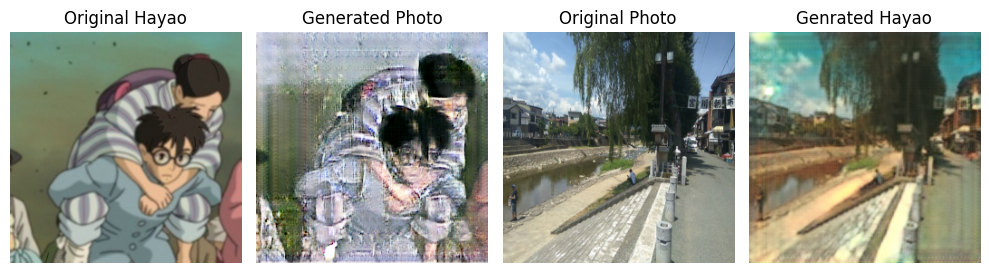

Epochs:  55%|███████████████████████████████████▊                             | 55/100 [19:59:02<18:47:49, 1503.77s/it]

1/1 [==============================] - 0s 50ms/step


Epochs:  56%|████████████████████████████████████▍                            | 56/100 [20:24:40<18:30:13, 1513.95s/it]

Epoch 56/100
dA_loss_real: 0.013400471299731483, dA_loss_fake: 0.012743424918638387
dB_loss_real: 0.028282701727778962, dB_loss_fake: 0.03141859282196189
gen_loss1: 2.608963704307874, gen_loss2: 2.9989358417193093
1/1 [==============================] - 0s 50ms/step


Epochs:  57%|█████████████████████████████████████                            | 57/100 [20:50:38<18:14:28, 1527.19s/it]

Epoch 57/100
dA_loss_real: 0.012967280815549506, dA_loss_fake: 0.013839039271503376
dB_loss_real: 0.024455637210436785, dB_loss_fake: 0.02903349176514894
gen_loss1: 2.646186712185542, gen_loss2: 3.007860994140307
1/1 [==============================] - 0s 52ms/step


Epochs:  58%|█████████████████████████████████████▋                           | 58/100 [21:16:41<17:56:36, 1538.01s/it]

Epoch 58/100
dA_loss_real: 0.014808932765930271, dA_loss_fake: 0.01479883661280231
dB_loss_real: 0.023506741334761803, dB_loss_fake: 0.02700959821464494
gen_loss1: 2.615441323320071, gen_loss2: 2.9541739894946417
1/1 [==============================] - 0s 49ms/step


Epochs:  59%|██████████████████████████████████████▎                          | 59/100 [21:43:16<17:42:40, 1555.14s/it]

Epoch 59/100
dA_loss_real: 0.01360955573967658, dA_loss_fake: 0.013567446150118486
dB_loss_real: 0.02811240934417583, dB_loss_fake: 0.03071898179555622
gen_loss1: 2.6761157262325286, gen_loss2: 2.9927352954943975
1/1 [==============================] - 0s 47ms/step
Epoch 60/100
dA_loss_real: 0.015254247315848866, dA_loss_fake: 0.013994120898617741
dB_loss_real: 0.024071445607114585, dB_loss_fake: 0.02830472438518579
gen_loss1: 2.5577727927764258, gen_loss2: 2.8873238323132195
1/1 [==============================] - 0s 68ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


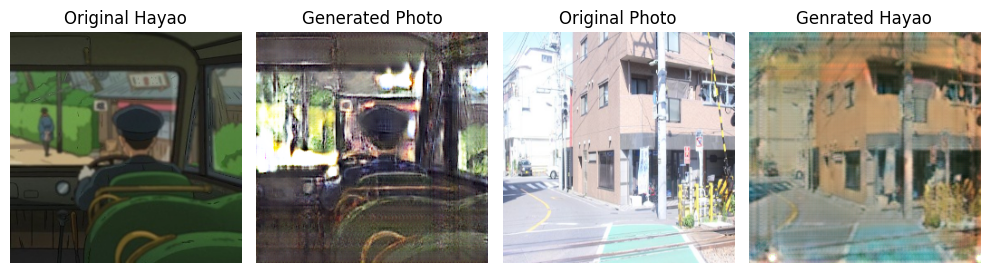

Epochs:  60%|███████████████████████████████████████                          | 60/100 [22:09:53<17:25:03, 1567.58s/it]

1/1 [==============================] - 0s 48ms/step


Epochs:  61%|███████████████████████████████████████▋                         | 61/100 [22:37:41<17:18:27, 1597.64s/it]

Epoch 61/100
dA_loss_real: 0.01072359233473738, dA_loss_fake: 0.010885840711998752
dB_loss_real: 0.02708745044035216, dB_loss_fake: 0.030346876192682733
gen_loss1: 2.5911505607763927, gen_loss2: 2.995290016333262
1/1 [==============================] - 0s 77ms/step


Epochs:  62%|████████████████████████████████████████▎                        | 62/100 [23:05:57<17:10:39, 1627.35s/it]

Epoch 62/100
dA_loss_real: 0.013474504378585455, dA_loss_fake: 0.01413506299975173
dB_loss_real: 0.024145004390738904, dB_loss_fake: 0.025651396843992796
gen_loss1: 2.610617035627365, gen_loss2: 2.932981338103612
1/1 [==============================] - 0s 95ms/step


Epochs:  63%|████████████████████████████████████████▉                        | 63/100 [23:33:56<16:53:06, 1642.87s/it]

Epoch 63/100
dA_loss_real: 0.010242970488616266, dA_loss_fake: 0.009493669646326452
dB_loss_real: 0.02609657317904445, dB_loss_fake: 0.029256721204922845
gen_loss1: 2.5495629956324897, gen_loss2: 2.94022655526797
1/1 [==============================] - 0s 73ms/step


Epochs:  64%|█████████████████████████████████████████▌                       | 64/100 [24:01:54<16:32:01, 1653.36s/it]

Epoch 64/100
dA_loss_real: 0.014385419939062559, dA_loss_fake: 0.01441456397762522
dB_loss_real: 0.024749194869073107, dB_loss_fake: 0.02770246725762263
gen_loss1: 2.5670719440778096, gen_loss2: 2.8962964258591333
1/1 [==============================] - 0s 67ms/step
Epoch 65/100
dA_loss_real: 0.010205633380101062, dA_loss_fake: 0.010202631039137487
dB_loss_real: 0.025954015635264418, dB_loss_fake: 0.02963758317520842
gen_loss1: 2.5716653813918433, gen_loss2: 2.9568837972482047
1/1 [==============================] - 0s 97ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


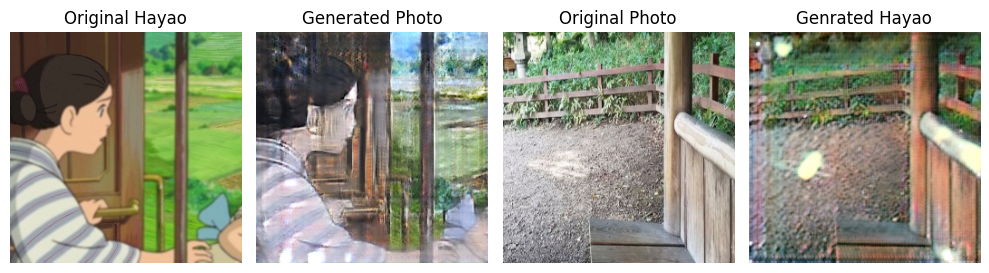

Epochs:  65%|██████████████████████████████████████████▎                      | 65/100 [24:30:06<16:11:06, 1664.75s/it]

1/1 [==============================] - 0s 64ms/step


Epochs:  66%|██████████████████████████████████████████▉                      | 66/100 [24:58:11<15:46:55, 1671.03s/it]

Epoch 66/100
dA_loss_real: 0.009635161848273129, dA_loss_fake: 0.00829504817937656
dB_loss_real: 0.02601273787789978, dB_loss_fake: 0.028577812163469694
gen_loss1: 2.4468340055147806, gen_loss2: 2.873304378390312
1/1 [==============================] - 0s 82ms/step


Epochs:  67%|███████████████████████████████████████████▌                     | 67/100 [25:26:33<15:24:05, 1680.16s/it]

Epoch 67/100
dA_loss_real: 0.012541155184347492, dA_loss_fake: 0.012381038861349225
dB_loss_real: 0.024072368323104457, dB_loss_fake: 0.02558320736590152
gen_loss1: 2.534163187344869, gen_loss2: 2.868078469634056
1/1 [==============================] - 0s 54ms/step


Epochs:  68%|████████████████████████████████████████████▏                    | 68/100 [25:55:23<15:04:06, 1695.21s/it]

Epoch 68/100
dA_loss_real: 0.006239006485654197, dA_loss_fake: 0.005918536027990437
dB_loss_real: 0.021831880138100435, dB_loss_fake: 0.02450053328842235
gen_loss1: 2.5460052037239076, gen_loss2: 2.952003904779752
1/1 [==============================] - 0s 57ms/step


Epochs:  69%|████████████████████████████████████████████▊                    | 69/100 [26:24:47<14:46:34, 1715.94s/it]

Epoch 69/100
dA_loss_real: 0.008045981545195294, dA_loss_fake: 0.007679546313205113
dB_loss_real: 0.02270491910011818, dB_loss_fake: 0.02528655544583065
gen_loss1: 2.506736149986585, gen_loss2: 2.881570130785306
1/1 [==============================] - 0s 61ms/step
Epoch 70/100
dA_loss_real: 0.013946575056567477, dA_loss_fake: 0.012485066077497322
dB_loss_real: 0.020095299360497546, dB_loss_fake: 0.02162841343204491
gen_loss1: 2.5548963330189385, gen_loss2: 2.844062859217326
1/1 [==============================] - 0s 54ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


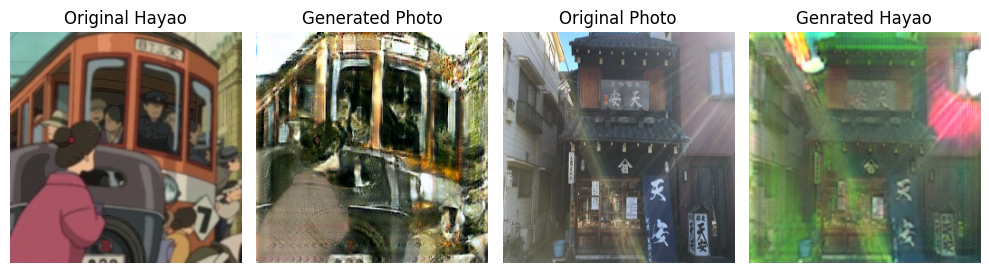

Epochs:  70%|█████████████████████████████████████████████▌                   | 70/100 [26:55:23<14:35:56, 1751.88s/it]

1/1 [==============================] - 0s 59ms/step


Epochs:  71%|██████████████████████████████████████████████▏                  | 71/100 [27:25:57<14:18:33, 1776.34s/it]

Epoch 71/100
dA_loss_real: 0.009869530990060108, dA_loss_fake: 0.009930429136632786
dB_loss_real: 0.01922859416168649, dB_loss_fake: 0.020904048420488833
gen_loss1: 2.567756612300873, gen_loss2: 2.870600621700287
1/1 [==============================] - 0s 69ms/step


Epochs:  72%|██████████████████████████████████████████████▊                  | 72/100 [27:56:02<13:52:59, 1784.97s/it]

Epoch 72/100
dA_loss_real: 0.009754347294025745, dA_loss_fake: 0.009812007656922408
dB_loss_real: 0.023608826284762473, dB_loss_fake: 0.025241238162852824
gen_loss1: 2.4594289024670917, gen_loss2: 2.83615424990654
1/1 [==============================] - 0s 46ms/step


Epochs:  73%|███████████████████████████████████████████████▍                 | 73/100 [29:23:45<21:12:48, 2828.45s/it]

Epoch 73/100
dA_loss_real: 0.0070571367076869744, dA_loss_fake: 0.006285736183344852
dB_loss_real: 0.02370168364412772, dB_loss_fake: 0.027841571473206084
gen_loss1: 2.4265720419089, gen_loss2: 2.831590869228045
1/1 [==============================] - 0s 57ms/step


Epochs:  74%|████████████████████████████████████████████████                 | 74/100 [29:51:06<17:51:18, 2472.26s/it]

Epoch 74/100
dA_loss_real: 0.008491538124508225, dA_loss_fake: 0.008322470638619657
dB_loss_real: 0.0217553846402249, dB_loss_fake: 0.024554553356332085
gen_loss1: 2.4716253940264385, gen_loss2: 2.847503120700518
1/1 [==============================] - 0s 67ms/step
Epoch 75/100
dA_loss_real: 0.008509741143886156, dA_loss_fake: 0.008650024681652818
dB_loss_real: 0.02027056903578341, dB_loss_fake: 0.022303575308372577
gen_loss1: 2.5127417149146396, gen_loss2: 2.8360101089874905
1/1 [==============================] - 0s 92ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


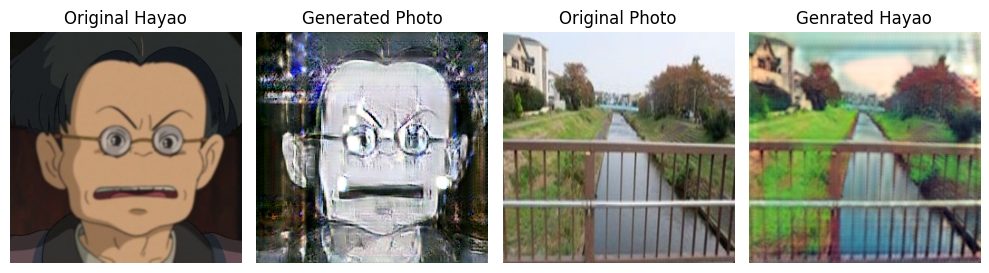

Epochs:  75%|████████████████████████████████████████████████▊                | 75/100 [30:18:43<15:28:08, 2227.53s/it]

1/1 [==============================] - 0s 57ms/step


Epochs:  76%|█████████████████████████████████████████████████▍               | 76/100 [30:46:42<13:45:13, 2063.06s/it]

Epoch 76/100
dA_loss_real: 0.008492386620879795, dA_loss_fake: 0.008220548820584856
dB_loss_real: 0.017942146822072878, dB_loss_fake: 0.01978516153525561
gen_loss1: 2.5480029384295144, gen_loss2: 2.822129340171814
1/1 [==============================] - 0s 66ms/step


Epochs:  77%|██████████████████████████████████████████████████               | 77/100 [31:14:58<12:28:38, 1952.97s/it]

Epoch 77/100
dA_loss_real: 0.005199401588712741, dA_loss_fake: 0.005046350180588585
dB_loss_real: 0.020374675296091785, dB_loss_fake: 0.02197802187448057
gen_loss1: 2.4498740522066753, gen_loss2: 2.8019335093100866
1/1 [==============================] - 0s 55ms/step


Epochs:  78%|██████████████████████████████████████████████████▋              | 78/100 [31:43:32<11:29:47, 1881.24s/it]

Epoch 78/100
dA_loss_real: 0.001340130827302346, dA_loss_fake: 0.001180505420731303
dB_loss_real: 0.021041792846129587, dB_loss_fake: 0.021803447260754182
gen_loss1: 2.341368212898572, gen_loss2: 2.758857673406601
1/1 [==============================] - 0s 56ms/step


Epochs:  79%|███████████████████████████████████████████████████▎             | 79/100 [32:12:37<10:44:11, 1840.57s/it]

Epoch 79/100
dA_loss_real: 0.001040691716140524, dA_loss_fake: 0.0009077082982063681
dB_loss_real: 0.022944850976346062, dB_loss_fake: 0.02389407517078022
gen_loss1: 2.325403561989466, gen_loss2: 2.7685318287213643
1/1 [==============================] - 0s 57ms/step
Epoch 80/100
dA_loss_real: 0.010874430479937776, dA_loss_fake: 0.009251686106338941
dB_loss_real: 0.020306729070143775, dB_loss_fake: 0.02163210594289315
gen_loss1: 2.3149514104922613, gen_loss2: 2.7139984236160912
1/1 [==============================] - 0s 95ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


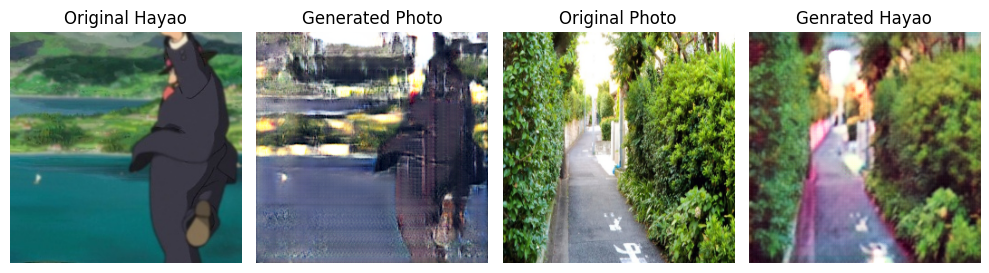

Epochs:  80%|████████████████████████████████████████████████████             | 80/100 [32:41:52<10:04:54, 1814.71s/it]

1/1 [==============================] - 0s 59ms/step


Epochs:  81%|█████████████████████████████████████████████████████▍            | 81/100 [33:11:45<9:32:33, 1808.10s/it]

Epoch 81/100
dA_loss_real: 0.011067012741987127, dA_loss_fake: 0.012128631057227418
dB_loss_real: 0.01935795654077083, dB_loss_fake: 0.01905033091432415
gen_loss1: 2.4869816509882607, gen_loss2: 2.801737895409266
1/1 [==============================] - 0s 73ms/step


Epochs:  82%|██████████████████████████████████████████████████████            | 82/100 [33:41:34<9:00:42, 1802.38s/it]

Epoch 82/100
dA_loss_real: 0.008580594480930208, dA_loss_fake: 0.008835299444326665
dB_loss_real: 0.020244984256181243, dB_loss_fake: 0.021156951582136874
gen_loss1: 2.4370651211341223, gen_loss2: 2.754449265797933
1/1 [==============================] - 0s 64ms/step


Epochs:  83%|██████████████████████████████████████████████████████▊           | 83/100 [34:12:23<8:34:43, 1816.65s/it]

Epoch 83/100
dA_loss_real: 0.006883785511017777, dA_loss_fake: 0.006841911066536947
dB_loss_real: 0.020099316843940566, dB_loss_fake: 0.020880401474035654
gen_loss1: 2.404150162736575, gen_loss2: 2.769043591618538
1/1 [==============================] - 0s 85ms/step


Epochs:  84%|███████████████████████████████████████████████████████▍          | 84/100 [34:44:07<8:11:22, 1842.66s/it]

Epoch 84/100
dA_loss_real: 0.00791600402352439, dA_loss_fake: 0.007050692859338597
dB_loss_real: 0.016745384617242964, dB_loss_fake: 0.018973869906039907
gen_loss1: 2.516143664916356, gen_loss2: 2.858052768309911
1/1 [==============================] - 0s 78ms/step
Epoch 85/100
dA_loss_real: 0.0008664893849830454, dA_loss_fake: 0.0008101223792618839
dB_loss_real: 0.021179264407449713, dB_loss_fake: 0.023856290304878104
gen_loss1: 2.3088250255584715, gen_loss2: 2.7428967299064
1/1 [==============================] - 0s 105ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


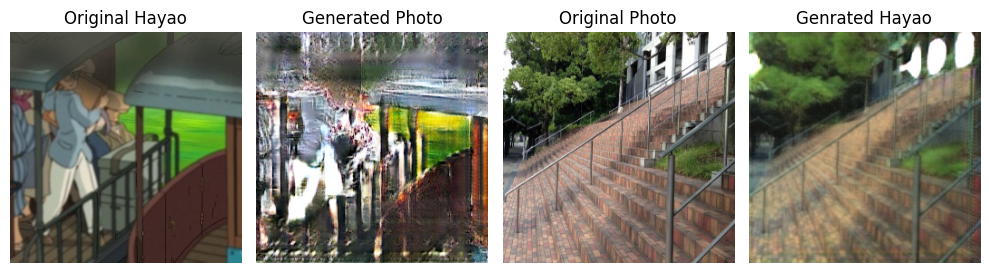

Epochs:  85%|████████████████████████████████████████████████████████          | 85/100 [35:16:22<7:47:34, 1870.32s/it]

1/1 [==============================] - 0s 110ms/step


Epochs:  86%|████████████████████████████████████████████████████████▊         | 86/100 [35:51:21<7:32:27, 1939.10s/it]

Epoch 86/100
dA_loss_real: 0.000713695636780661, dA_loss_fake: 0.0007716362268062463
dB_loss_real: 0.02028869170617933, dB_loss_fake: 0.023185653705925992
gen_loss1: 2.2878390328089395, gen_loss2: 2.7247105755408607
1/1 [==============================] - 0s 76ms/step


Epochs:  87%|█████████████████████████████████████████████████████████▍        | 87/100 [36:25:49<7:08:30, 1977.75s/it]

Epoch 87/100
dA_loss_real: 0.0007829588900494854, dA_loss_fake: 0.000755169183879237
dB_loss_real: 0.019991822103814533, dB_loss_fake: 0.022793873452659076
gen_loss1: 2.302854050596555, gen_loss2: 2.7008472263813017
1/1 [==============================] - 0s 65ms/step


Epochs:  88%|██████████████████████████████████████████████████████████        | 88/100 [36:59:00<6:36:21, 1981.75s/it]

Epoch 88/100
dA_loss_real: 0.012684586861190231, dA_loss_fake: 0.011909379704253903
dB_loss_real: 0.017817689119450128, dB_loss_fake: 0.019150546975045774
gen_loss1: 2.4158769915501277, gen_loss2: 2.70074733376503
1/1 [==============================] - 0s 80ms/step


Epochs:  89%|██████████████████████████████████████████████████████████▋       | 89/100 [37:32:59<6:06:28, 1998.92s/it]

Epoch 89/100
dA_loss_real: 0.006795951805882699, dA_loss_fake: 0.005893417117913486
dB_loss_real: 0.017842494681244717, dB_loss_fake: 0.018417635927132022
gen_loss1: 2.361920341650645, gen_loss2: 2.705665823618571
1/1 [==============================] - 0s 70ms/step
Epoch 90/100
dA_loss_real: 0.0059601650033437184, dA_loss_fake: 0.005735120559644808
dB_loss_real: 0.019629506046961374, dB_loss_fake: 0.020915958555803325
gen_loss1: 2.347434812585513, gen_loss2: 2.6762904729445776
1/1 [==============================] - 0s 186ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


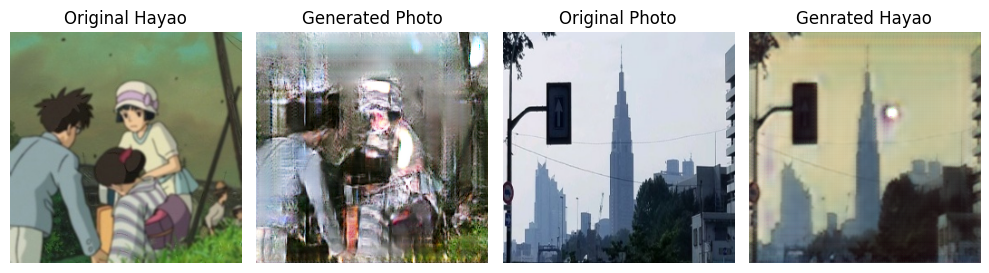

Epochs:  90%|███████████████████████████████████████████████████████████▍      | 90/100 [38:06:35<5:34:00, 2004.01s/it]

1/1 [==============================] - 0s 80ms/step


Epochs:  91%|████████████████████████████████████████████████████████████      | 91/100 [38:40:06<5:00:53, 2005.98s/it]

Epoch 91/100
dA_loss_real: 0.005518622424084849, dA_loss_fake: 0.005461160050472245
dB_loss_real: 0.01795683102022546, dB_loss_fake: 0.017559171970933676
gen_loss1: 2.3791776859760283, gen_loss2: 2.7412453627586366
1/1 [==============================] - 0s 75ms/step


Epochs:  92%|████████████████████████████████████████████████████████████▋     | 92/100 [39:14:08<4:28:55, 2016.98s/it]

Epoch 92/100
dA_loss_real: 0.005270507115128566, dA_loss_fake: 0.005078765601598813
dB_loss_real: 0.01944554706919007, dB_loss_fake: 0.020747394628124312
gen_loss1: 2.341941785812378, gen_loss2: 2.6845557127396265
1/1 [==============================] - 0s 87ms/step


Epochs:  93%|█████████████████████████████████████████████████████████████▍    | 93/100 [39:47:31<3:54:47, 2012.56s/it]

Epoch 93/100
dA_loss_real: 0.0027396655101862657, dA_loss_fake: 0.0030943689655396154
dB_loss_real: 0.016923531972958396, dB_loss_fake: 0.018244873038105045
gen_loss1: 2.3392220731576283, gen_loss2: 2.701099998950958
1/1 [==============================] - 0s 87ms/step


In [ ]:
train(d_A, d_B, g_AB, g_BA, c_AB, c_BA, epochs=100, chunk=5)

In [ ]:
g_AB.save("GeneratorHtoP_100.h5")
g_BA.save("GeneratorPtoH_100.h5")

In [21]:
HtoZ_gen = load_model("C:/Users/IT/midas/GeneratorHtoP_90.h5")
ZtoH_gen = load_model("C:/Users/IT/midas/GeneratorPtoH_90.h5")

1/1 [==============================] - 0s 21ms/step


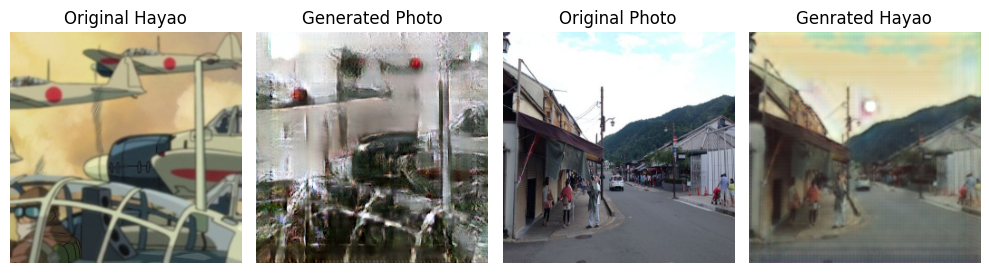

1/1 [==============================] - 0s 20ms/step


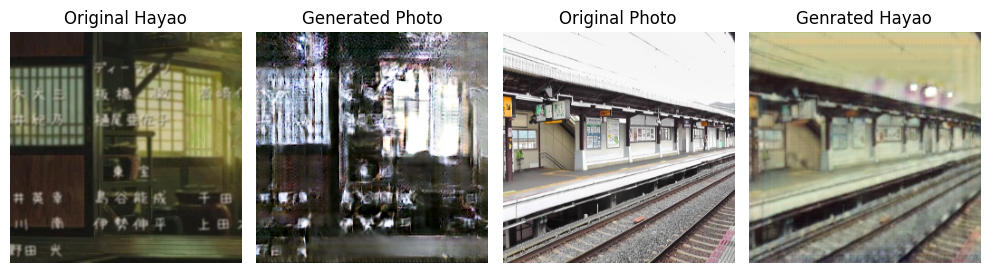

1/1 [==============================] - 0s 20ms/step


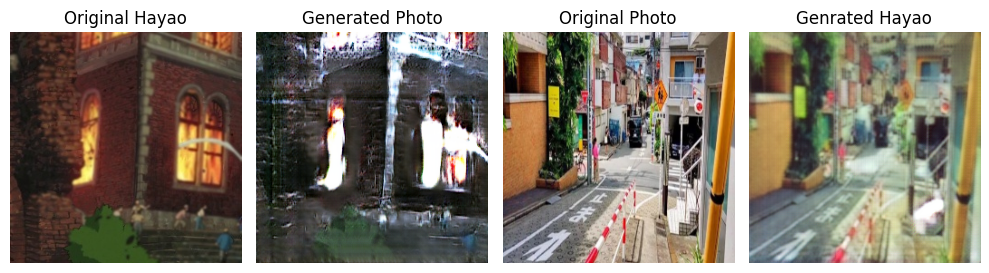

1/1 [==============================] - 0s 21ms/step


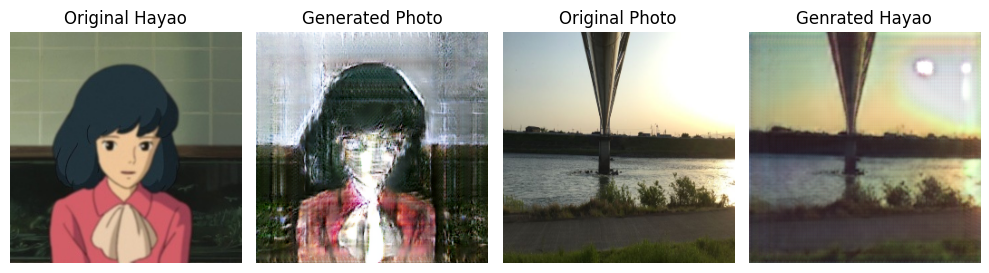

1/1 [==============================] - 0s 20ms/step


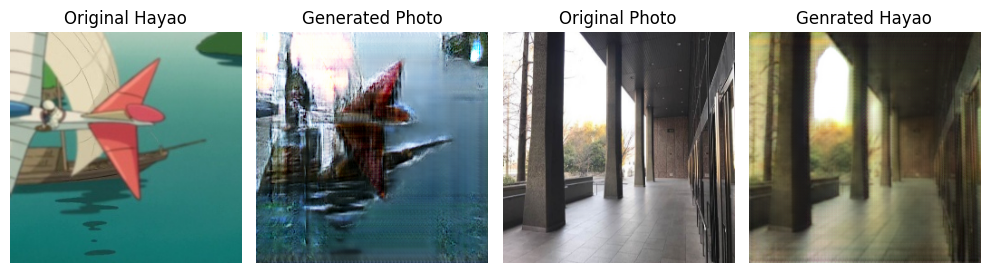

In [30]:
show_preds(HtoZ_gen, ZtoH_gen, n_images=5)

C:\Users\IT\anaconda3\envs\gpu\lib\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
C:\Users\IT\anaconda3\envs\gpu\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.11.0 and strictly below 2.14.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.10.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to 

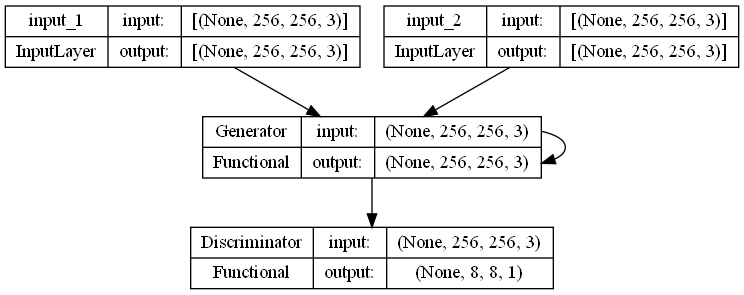

In [1]:
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, ReLU, LeakyReLU, Activation, concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal
from tensorflow_addons.layers import InstanceNormalization
from tensorflow.keras.utils import plot_model

# Assuming SIZE is defined as 256
SIZE = 256

def ResidualBlock(filters, layer, index):
    x = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False, name="Block_{}_Conv1".format(index))(layer)
    x = InstanceNormalization(axis=-1, name="Block_{}_Normalization1".format(index))(x)
    x = ReLU(name="Block_{}_ReLU".format(index))(x)
    
    x = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False, name="Block_{}_Conv2".format(index))(x)
    x = InstanceNormalization(axis=-1, name="Block_{}_Normalization2".format(index))(x)
    
    x = concatenate([x, layer], name="Block_{}_Merge".format(index))
    
    return x

def downsample(filters, layer, size=3, strides=2, activation=None, index=None, norm=True):
    x = Conv2D(filters, kernel_size=size, strides=strides, padding='same', kernel_initializer='he_normal', use_bias=False, name="Encoder_{}_Conv".format(index))(layer)
    if norm:
        x = InstanceNormalization(axis=-1, name="Encoder_{}_Normalization".format(index))(x)
    if activation is not None:
        x = Activation(activation, name="Encoder_{}_Activation".format(index))(x)
    else:
        x = LeakyReLU(name="Encoder_{}_LeakyReLU".format(index))(x)
    return x

def upsample(filters, layer, size=3, strides=2, index=None):
    x = Conv2DTranspose(filters, kernel_size=size, strides=strides, padding='same', kernel_initializer='he_normal', use_bias=False, name="Decoder_{}_ConvT".format(index))(layer)
    x = InstanceNormalization(axis=-1, name="Decoder_{}_Normalization".format(index))(x)
    x = ReLU(name="Decoder_{}_ReLU".format(index))(x)
    return x

def Generator(n_resnet=9, name="Generator"):
    inp_image = Input(shape=(SIZE, SIZE, 3), name="InputImage")
    
    x = downsample(64, inp_image, size=7, strides=1, index=1)
    x = downsample(128, x, index=2)
    x = downsample(256, x, index=3)
    
    for i in range(n_resnet):
        x = ResidualBlock(256, x, index=i+4)
    
    x = upsample(128, x, index=13)
    x = upsample(64, x, index=14)
    x = downsample(3, x, size=7, strides=1, activation='tanh', index=15)
    
    model = Model(inputs=inp_image, outputs=x, name=name)
    return model

def Discriminator(name='Discriminator'):
    init = RandomNormal(stddev=0.02)
    src_img = Input(shape=(SIZE, SIZE, 3), name="InputImage")
    x = downsample(64, src_img, size=4, strides=2, index=1, norm=False)
    x = downsample(128, x, size=4, strides=2, index=2)
    x = downsample(256, x, size=4, strides=2, index=3)
    x = downsample(512, x, size=4, strides=2, index=4)
    x = downsample(512, x, size=4, strides=2, index=5)
    patch_out = Conv2D(1, kernel_size=4, padding='same', kernel_initializer=init, use_bias=False)(x)
    
    model = Model(inputs=src_img, outputs=patch_out, name=name)
    model.compile(loss='mse', optimizer=Adam(learning_rate=2e-4, beta_1=0.5), loss_weights=[0.5])
    return model

def CombineModel(g_model1, g_model2, d_model, name):
    g_model1.trainable = True
    d_model.trainable = False
    g_model2.trainable = False
    
    input_gen = Input(shape=(SIZE, SIZE, 3))
    gen_1_out = g_model1(input_gen)
    dis_out = d_model(gen_1_out)
    
    input_id = Input(shape=(SIZE, SIZE, 3))
    output_id = g_model1(input_id)
    
    output_f = g_model2(gen_1_out)
    
    gen_2_out = g_model2(input_id)
    output_b = g_model1(gen_2_out)
    
    model = Model(inputs=[input_gen, input_id], outputs=[dis_out, output_id, output_f, output_b], name=name)
    model.compile(loss=['mse', 'mae', 'mae', 'mae'], loss_weights=[1,5,10,10], optimizer=Adam(learning_rate=2e-4, beta_1=0.5))
    return model

# Create models
generator = Generator()
discriminator = Discriminator()
combined_model = CombineModel(generator, generator, discriminator, "CombinedModel")

# Plot models
plot_model(generator, to_file="generator_model.png", show_shapes=True, show_layer_names=True)
plot_model(discriminator, to_file="discriminator_model.png", show_shapes=True, show_layer_names=True)
plot_model(combined_model, to_file="combined_model.png", show_shapes=True, show_layer_names=True)
